### <span style="color:red">**IMPORTANT: Execute the cell below before proceeding:**</span> 

In [6]:
from resources309 import *
get_resources("perspective.py", "mural.jpg", "magritte.jpg")

from py309.perspective import *
import matplotlib.pyplot as plt

Resource check finished.


# Camera perspective

This notebook demonstrates how to remove camera perspective from an image (and, conversely, how to add it to an image). From the linear algebra perspective, the main tool used in this process is a change of coordinates between the coordinate system defined by the camera and the coordinate system defined by the photographed object. 

## Image rectification 

As an example we will be working with a jpg image file:

In [3]:
#load the image 
mural = plt.imread(url)

ValueError: invalid PNG header

The image is loaded as an array of vectors, one vector for each image pixel. Each vector has three coordinates that describe the color of the pixel as a combination of red, green, and blue components: 

In [3]:
mural

array([[[183, 172, 166],
        [188, 179, 172],
        [206, 197, 190],
        ...,
        [ 30,  91, 145],
        [ 21,  59, 121],
        [  4,  42, 104]],

       [[152, 141, 135],
        [154, 145, 138],
        [164, 155, 148],
        ...,
        [  4,  21,  67],
        [ 10,  24,  59],
        [  8,  22,  57]],

       [[196, 187, 178],
        [179, 170, 161],
        [159, 152, 142],
        ...,
        [ 30,  20,  72],
        [ 21,  31, 102],
        [ 34,  44, 115]],

       ...,

       [[210, 200, 191],
        [214, 204, 195],
        [222, 212, 203],
        ...,
        [  7,   7,   7],
        [  7,   7,   7],
        [  7,   7,   7]],

       [[209, 199, 190],
        [211, 201, 192],
        [215, 205, 196],
        ...,
        [  7,   7,   7],
        [  8,   8,   8],
        [  8,   8,   8]],

       [[209, 199, 189],
        [208, 198, 188],
        [208, 198, 188],
        ...,
        [  7,   7,   7],
        [  7,   7,   7],
        [  7,   7,   7]]

We can display the image in the notebook as follows:

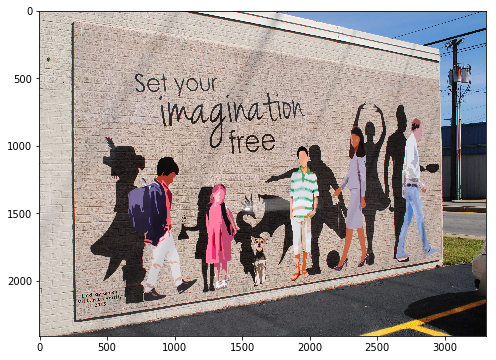

In [4]:
# this sets the width and height of the displayed image 
plt.figure(figsize = (8,6)) 

#show the image
plt.imshow(mural)
plt.show()

We will rectify the mural depicted on the photo. In order to do it, we need to know pixel coordinates of the corners of the mural. The following command will be helpful, since it displays the photo in an interactive way and shows pixel coordinates:

In [3]:
%matplotlib notebook

Once the above command is executed all images will be shown in the interactive mode:

<IPython.core.display.Javascript object>


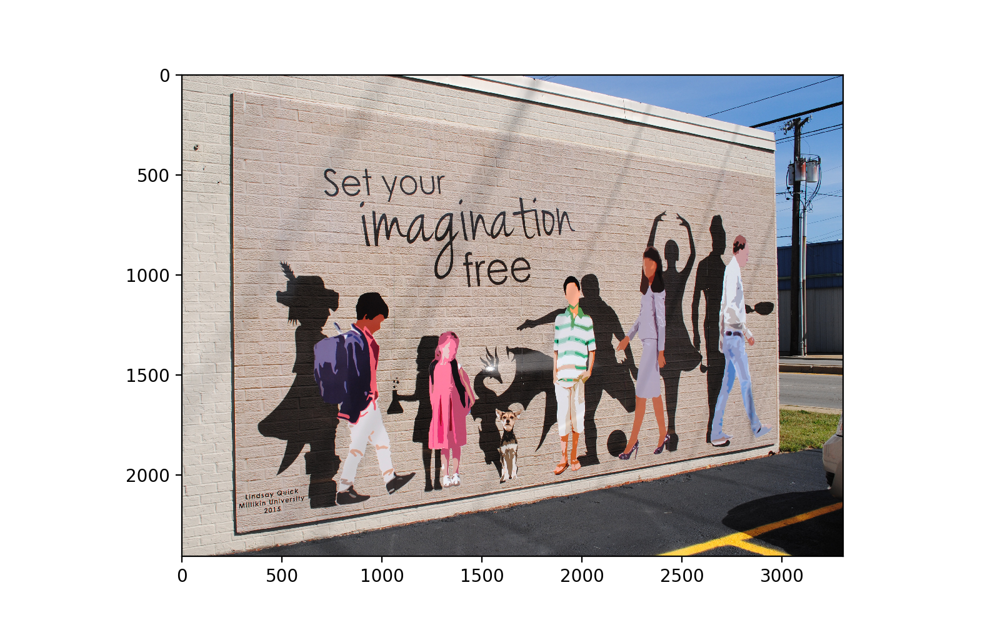

In [4]:
#set the width and height of the displayed image 
plt.figure(figsize = (8,5)) 

#show the image
plt.imshow(mural)
plt.show()

<p></p>

The buttons below the image let us manipulate the display. After clicking on the white square button we can select a rectangular area of the image to zoom on. The house button returns to the original view of the image.

<img src="supplements/matplotlib_notebook_icons.png" style="width:200pt; ">

When the cursor is on the image, x and y coordinates of the pixel under the cursor are displayed under the image, on the right side. The three numbers in the square brackets describe the color of the pixel.

<img src="supplements/pixel_coordinates.png" style="width:500pt;  box-shadow: 0 4px 8px 0 rgba(0, 0, 0, 0.2), 0 6px 20px 0 rgba(0, 0, 0, 0.19);">


<p></p>

**Note.** Clicking on the blue power button above the image turns off interactivity.

Using the interactive image display we get the following approximate coordinates of the mural corners (rounded to the nearest integers):

|                  | **x** | **y** |
|------------------|-------|-------|
| **upper left**   | 252   | 72    |
| **upper right**  | 2958  | 514   |
| **lower left**   | 274   | 2291  |
| **lower right**  | 2975  | 1839  |

We assign the list of these coordinates to the `mural_coordinates` variable. For our purposes corner coordinates must come in the same order as in the table above (upper left, upper right, lower left, lower right). 

<p></p>

In [5]:
mural_corners = [[258, 72], [2958, 514], [274, 2291], [2975, 1839]]

The function `rectify_image()` uses a change of coordinates to remove camera perspective from a part of the image defined by the corner pixels. 
It takes four arguments:

- `img` = an array representing an image
- `corners` = a list of pixel coordinates of the corners of the area we want to rectify
- `width` and `height` = the width and height (in pixels) of the rectified image.

In [6]:
flat_mural = rectify_image(img = mural, corners=mural_corners, height= 2000, width = 1000)

The function returns an array representing the rectified image. This image looks as follows:

<IPython.core.display.Javascript object>


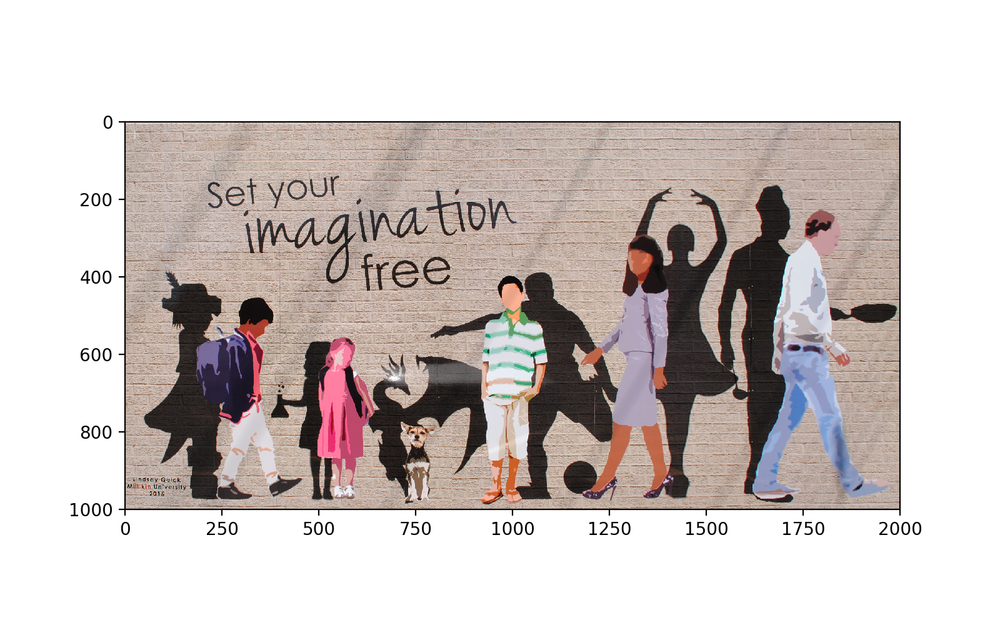

In [7]:
#set the width and height of the displayed image 
plt.figure(figsize = (8,5)) 

#show the image
plt.imshow(flat_mural)
plt.show()

The following command can be used to save the rectified image to a jpg file. The file will be created in the same directory where this notebook is located: 

In [8]:
#the first argument of the imsave function is the name of the file we want to create
#the second is the array representing the image
plt.imsave("rectified_mural.jpg", flat_mural)

## Adding perspective

The above procedure works by switching from the coordinate system defined by the photographed object (in our example the mural) to the coordinate system defined to the camera. Since coordinate changes work in both directions, we can revert this process to add perspective to a flat image. The function `paste_image()` illustrates this. It takes three arguments:

- `img` = an array representing a "flat" image to which we want to add perspective
- `background` = an array representing a background image onto which we will paste the image with perspective
- `corners` = a list of coordinates of  four pixels of the background that define the area where the image with added perspective is to be pasted.

As an example, we will use as the background the same photo of the mural as before:

<IPython.core.display.Javascript object>


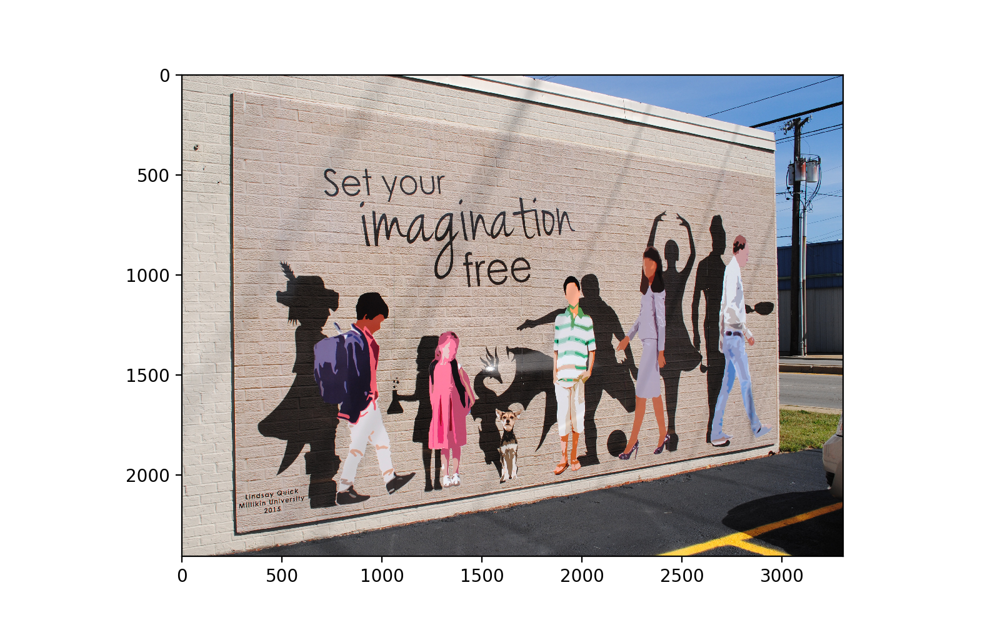

In [12]:
#load the image 
mural = plt.imread("supplements/mural.jpg")

#set the width and height of the displayed image 
plt.figure(figsize = (8,5)) 

#show the image
plt.imshow(mural)
plt.show()

Here is again the list of coordinates of corner pixels of the mural:

In [11]:
mural_corners = [[258, 72], [2958, 514], [274, 2291], [2975, 1839]]

As the "flat" image we will use a photo of a painting by Ren&eacute; Magritte:

<IPython.core.display.Javascript object>


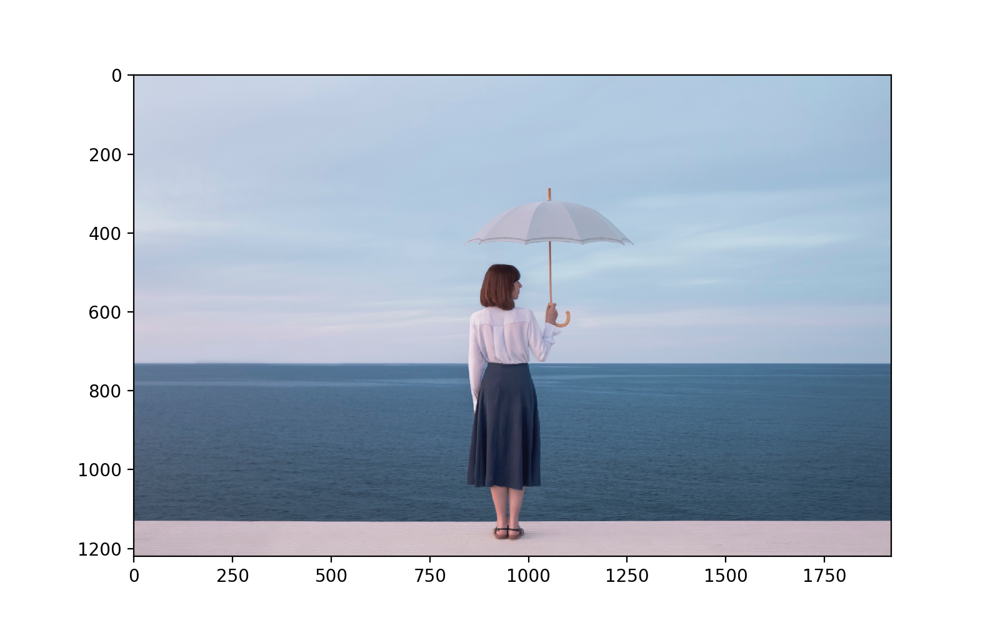

In [12]:
#load the image 
magritte = plt.imread("supplements/magritte.jpg")

#set the width and height of the displayed image 
plt.figure(figsize = (8,5)) 

#show the image
plt.imshow(magritte)
plt.show()

The function `paste_image` returns an array representing the modified background image:

In [13]:
new_image = paste_image(img=magritte, background=mural, corners = mural_corners)

Here is the image obtained in this way:

<IPython.core.display.Javascript object>


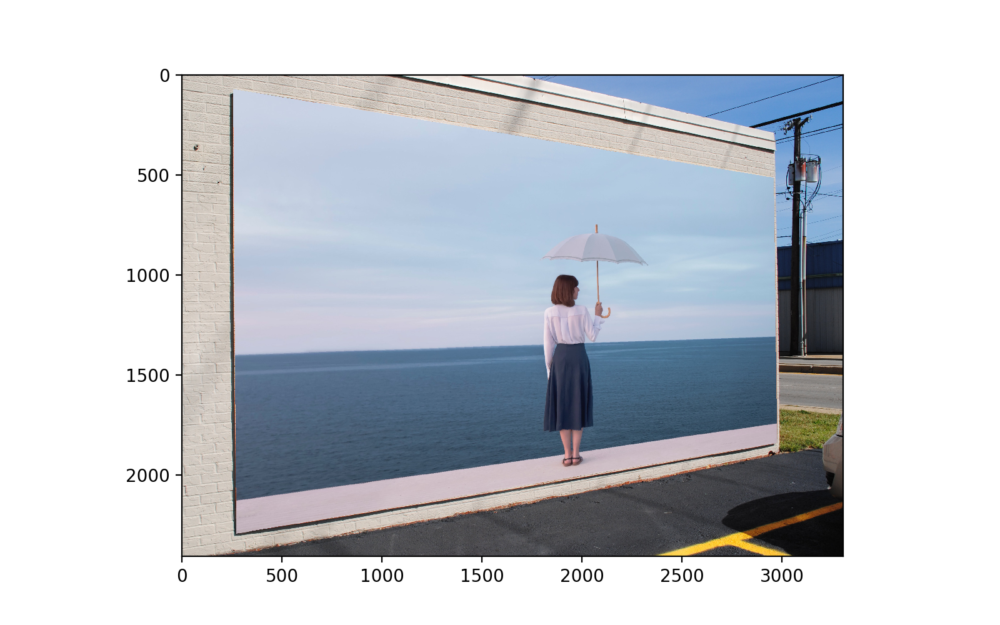

In [14]:
#set the width and height of the displayed image 
plt.figure(figsize = (8,5)) 

#show the image
plt.imshow(new_image)
plt.show()